# Twitter Sentiment Analysis using nltk

In [11]:
!pip install kaggle

In [12]:
#configuring the path of kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [13]:
#API to fetch the dataset from kaggle
!kaggle datasets download -d kazanova/sentiment140

Dataset URL: https://www.kaggle.com/datasets/kazanova/sentiment140
License(s): other
sentiment140.zip: Skipping, found more recently modified local copy (use --force to force download)


In [14]:
# extracting the compressed dataset
from zipfile import ZipFile
dataset = 'sentiment140.zip'
with ZipFile(dataset,'r') as zip:
    zip.extractall()
    print('The dataset is extracted')

The dataset is extracted


## Importing Required Libraries

In [15]:
!pip install wordcloud

In [16]:
!pip install textblob

In [17]:
import numpy as np
import pandas as pd
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from textblob import TextBlob

In [18]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/snehiljaiswal/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [19]:
print(stopwords.words('english')) #stopwords are the words which does not have specific meaning

['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further', 'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven', "haven't", 'having', 'he', "he'd", "he'll", 'her', 'here', 'hers', 'herself', "he's", 'him', 'himself', 'his', 'how', 'i', "i'd", 'if', "i'll", "i'm", 'in', 'into', 'is', 'isn', "isn't", 'it', "it'd", "it'll", "it's", 'its', 'itself', "i've", 'just', 'll', 'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn', "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not', 'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'other', 'our', 'ours', 'ourselves', 'out', 'over', 'own', 're', 's', 'same', 'shan', "shan't", 'she

## Data Processing

In [20]:
twitter_data = pd.read_csv('training.1600000.processed.noemoticon.csv', encoding = 'ISO-8859-1')

In [21]:
twitter_data

,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D"
0,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
1,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
2,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
3,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."
4,0,1467811372,Mon Apr 06 22:20:00 PDT 2009,NO_QUERY,joy_wolf,@Kwesidei not the whole crew
...,...,...,...,...,...,...
1599994,4,2193601966,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,AmandaMarie1028,Just woke up. Having no school is the best fee...
1599995,4,2193601969,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,TheWDBoards,TheWDB.com - Very cool to hear old Walt interv...
1599996,4,2193601991,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,bpbabe,Are you ready for your MoJo Makeover? Ask me f...
1599997,4,2193602064,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,tinydiamondz,Happy 38th Birthday to my boo of alll time!!! ...


In [22]:
twitter_data.shape

(1599999, 6)

In [23]:
#naming the columns and reading the dataset again
column_names = ['target','id','date','flag','user','text']
twitter_data = pd.read_csv('training.1600000.processed.noemoticon.csv', names = column_names, encoding = 'ISO-8859-1')

In [24]:
twitter_data.shape

(1600000, 6)

In [25]:
twitter_data.head(10)

,target,id,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."
5,0,1467811372,Mon Apr 06 22:20:00 PDT 2009,NO_QUERY,joy_wolf,@Kwesidei not the whole crew
6,0,1467811592,Mon Apr 06 22:20:03 PDT 2009,NO_QUERY,mybirch,Need a hug
7,0,1467811594,Mon Apr 06 22:20:03 PDT 2009,NO_QUERY,coZZ,@LOLTrish hey long time no see! Yes.. Rains a...
8,0,1467811795,Mon Apr 06 22:20:05 PDT 2009,NO_QUERY,2Hood4Hollywood,@Tatiana_K nope they didn't have it
9,0,1467812025,Mon Apr 06 22:20:09 PDT 2009,NO_QUERY,mimismo,@twittera que me muera ?


In [26]:
twitter_data.tail(10)

,target,id,date,flag,user,text
1599990,4,2193579249,Tue Jun 16 08:38:59 PDT 2009,NO_QUERY,razzberry5594,WOOOOO! Xbox is back
1599991,4,2193579284,Tue Jun 16 08:38:59 PDT 2009,NO_QUERY,AgustinaP,@rmedina @LaTati Mmmm That sounds absolutely ...
1599992,4,2193579434,Tue Jun 16 08:39:00 PDT 2009,NO_QUERY,sdancingsteph,ReCoVeRiNg FrOm ThE lOnG wEeKeNd
1599993,4,2193579477,Tue Jun 16 08:39:00 PDT 2009,NO_QUERY,ChloeAmisha,@SCOOBY_GRITBOYS
1599994,4,2193579489,Tue Jun 16 08:39:00 PDT 2009,NO_QUERY,EvolveTom,"@Cliff_Forster Yeah, that does work better tha..."
1599995,4,2193601966,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,AmandaMarie1028,Just woke up. Having no school is the best fee...
1599996,4,2193601969,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,TheWDBoards,TheWDB.com - Very cool to hear old Walt interv...
1599997,4,2193601991,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,bpbabe,Are you ready for your MoJo Makeover? Ask me f...
1599998,4,2193602064,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,tinydiamondz,Happy 38th Birthday to my boo of alll time!!! ...
1599999,4,2193602129,Tue Jun 16 08:40:50 PDT 2009,NO_QUERY,RyanTrevMorris,happy #charitytuesday @theNSPCC @SparksCharity...


In [27]:
#counting missing values in the dataset
twitter_data.isna()

,target,id,date,flag,user,text
0,False,False,False,False,False,False
1,False,False,False,False,False,False
2,False,False,False,False,False,False
3,False,False,False,False,False,False
4,False,False,False,False,False,False
...,...,...,...,...,...,...
1599995,False,False,False,False,False,False
1599996,False,False,False,False,False,False
1599997,False,False,False,False,False,False
1599998,False,False,False,False,False,False


In [28]:
twitter_data.isna().sum()

target    0
id        0
date      0
flag      0
user      0
text      0
dtype: int64

In [29]:
#checking the distribution of target column
twitter_data['target'].value_counts()

target
0    800000
4    800000
Name: count, dtype: int64

#### Convert the target "4" to "1"

In [30]:
twitter_data.replace({'target':{4:1}}, inplace=True)

In [31]:
#checking the distribution of target column
twitter_data['target'].value_counts()

target
0    800000
1    800000
Name: count, dtype: int64

### 0 --> Negative Tweet

### 1 --> Positive Tweet

# Stemming

Stemming is the process of reducing a word to its root word.

In [32]:
port_stem = PorterStemmer()

In [33]:
def stemming(content):
    stemmed_content = re.sub('[^a-zA-Z]',' ',content)
    stemmed_content = stemmed_content.lower()
    stemmed_content = stemmed_content.split()
    stemmed_content = [port_stem.stem(word) for word in stemmed_content if not word in stopwords.words('english')]
    stemmed_content = ' '.join(stemmed_content)
    return stemmed_content

In [34]:
twitter_data['stemmed_content'] = twitter_data['text'].apply(stemming) 

In [35]:
twitter_data.head(5)

,target,id,date,flag,user,text,stemmed_content
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",switchfoot http twitpic com zl awww bummer sho...
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...,upset updat facebook text might cri result sch...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...,kenichan dive mani time ball manag save rest g...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,whole bodi feel itchi like fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all....",nationwideclass behav mad see


In [36]:
print(twitter_data['stemmed_content'])

0          switchfoot http twitpic com zl awww bummer sho...
1          upset updat facebook text might cri result sch...
2          kenichan dive mani time ball manag save rest g...
3                            whole bodi feel itchi like fire
4                              nationwideclass behav mad see
                                 ...                        
1599995                           woke school best feel ever
1599996    thewdb com cool hear old walt interview http b...
1599997                         readi mojo makeov ask detail
1599998    happi th birthday boo alll time tupac amaru sh...
1599999    happi charitytuesday thenspcc sparkschar speak...
Name: stemmed_content, Length: 1600000, dtype: object


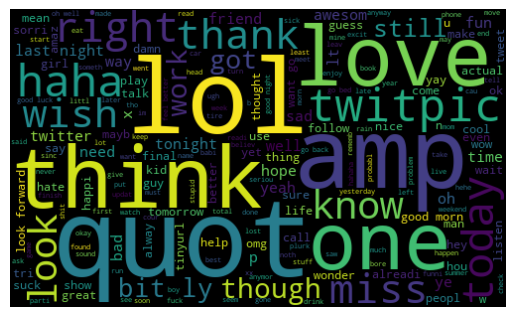

In [37]:
# Plot the word cloud
allWords = ' '.join( [twts for twts in twitter_data['stemmed_content']] )
wordCloud = WordCloud(width =500, height = 300, random_state = 21, max_font_size = 110).generate(allWords)
plt.imshow(wordCloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [38]:
print(twitter_data['target'])

0          0
1          0
2          0
3          0
4          0
          ..
1599995    1
1599996    1
1599997    1
1599998    1
1599999    1
Name: target, Length: 1600000, dtype: int64


In [39]:
#seperating the data andd label
X = twitter_data['stemmed_content'].values
Y = twitter_data['target'].values

In [40]:
print(X)

['switchfoot http twitpic com zl awww bummer shoulda got david carr third day'
 'upset updat facebook text might cri result school today also blah'
 'kenichan dive mani time ball manag save rest go bound' ...
 'readi mojo makeov ask detail'
 'happi th birthday boo alll time tupac amaru shakur'
 'happi charitytuesday thenspcc sparkschar speakinguph h']


In [41]:
print(Y)

[0 0 0 ... 1 1 1]


## Splitting the data into training data and test data

In [42]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.2, random_state=2, stratify=Y)
#test_size = 0.2 determines 20% of data is used for testing the model and 80% of data is used for training the model
#stratify = Y tells equal distribution of 0 & 4

In [43]:
print(X.shape, X_train.shape, X_test.shape)

(1600000,) (1280000,) (320000,)


In [44]:
X_train

array(['watch saw iv drink lil wine', 'hatermagazin',
       'even though favourit drink think vodka coke wipe mind time think im gonna find new drink',
       ..., 'eager monday afternoon',
       'hope everyon mother great day wait hear guy store tomorrow',
       'love wake folger bad voic deeper'], dtype=object)

In [45]:
X_test

array(['mmangen fine much time chat twitter hubbi back summer amp tend domin free time',
       'ah may show w ruth kim amp geoffrey sanhueza',
       'ishatara mayb bay area thang dammit', ...,
       'destini nevertheless hooray member wonder safe trip', 'feel well',
       'supersandro thank'], dtype=object)

In [46]:
#converting the textual data to numerical data
vector = TfidfVectorizer()
X_train = vector.fit_transform(X_train)
X_test = vector.transform(X_test)

In [47]:
print(X_train)

  (0, 443066)	0.4484755317023172
  (0, 235045)	0.41996827700291095
  (0, 109306)	0.3753708587402299
  (0, 185193)	0.5277679060576009
  (0, 354543)	0.3588091611460021
  (0, 436713)	0.27259876264838384
  (1, 160636)	1.0
  (2, 288470)	0.16786949597862733
  (2, 132311)	0.2028971570399794
  (2, 150715)	0.18803850583207948
  (2, 178061)	0.1619010109445149
  (2, 409143)	0.15169282335109835
  (2, 266729)	0.24123230668976975
  (2, 443430)	0.3348599670252845
  (2, 77929)	0.31284080750346344
  (2, 433560)	0.3296595898028565
  (2, 406399)	0.32105459490875526
  (2, 129411)	0.29074192727957143
  (2, 407301)	0.18709338684973031
  (2, 124484)	0.1892155960801415
  (2, 109306)	0.4591176413728317
  (3, 172421)	0.37464146922154384
  (3, 411528)	0.27089772444087873
  (3, 388626)	0.3940776331458846
  (3, 56476)	0.5200465453608686
  :	:
  (1279996, 390130)	0.22064742191076112
  (1279996, 434014)	0.2718945052332447
  (1279996, 318303)	0.21254698865277746
  (1279996, 237899)	0.2236567560099234
  (1279996, 2910

In [48]:
print(X_test)

  (0, 420984)	0.17915624523539803
  (0, 409143)	0.31430470598079707
  (0, 398906)	0.3491043873264267
  (0, 388348)	0.21985076072061738
  (0, 279082)	0.1782518010910344
  (0, 271016)	0.4535662391658828
  (0, 171378)	0.2805816206356073
  (0, 138164)	0.23688292264071403
  (0, 132364)	0.25525488955578596
  (0, 106069)	0.3655545001090455
  (0, 67828)	0.26800375270827315
  (0, 31168)	0.16247724180521766
  (0, 15110)	0.1719352837797837
  (1, 366203)	0.24595562404108307
  (1, 348135)	0.4739279595416274
  (1, 256777)	0.28751585696559306
  (1, 217562)	0.40288153995289894
  (1, 145393)	0.575262969264869
  (1, 15110)	0.211037449588008
  (1, 6463)	0.30733520460524466
  (2, 400621)	0.4317732461913093
  (2, 256834)	0.2564939661498776
  (2, 183312)	0.5892069252021465
  (2, 89448)	0.36340369428387626
  (2, 34401)	0.37916255084357414
  :	:
  (319994, 123278)	0.4530341382559843
  (319995, 444934)	0.32110928175992615
  (319995, 420984)	0.22631428606830148
  (319995, 416257)	0.23816465111736282
  (319995, 

# Training Machine Learning Model

## Logistic Regression 

In [49]:
model = LogisticRegression(max_iter=1000)

In [50]:
model.fit(X_train, Y_train)

LogisticRegression(max_iter=1000)

### Model Evaluation

### Accuracy score

In [51]:
#accuracy scone on the training data
X_train_prediction = model.predict(X_train)
training_data_accuracy = accuracy_score(Y_train, X_train_prediction)

In [52]:
print('Acccuracy score on the training data:',training_data_accuracy)

Acccuracy score on the training data: 0.81018125


In [53]:
#accuracy scone on the testing data
X_test_prediction = model.predict(X_test)
test_data_accuracy = accuracy_score(Y_test, X_test_prediction)

In [54]:
print('Acccuracy score on the test data:',test_data_accuracy)

Acccuracy score on the test data: 0.777996875


### Model accuracy = 77.79%

#### Saving the trained model

In [55]:
import pickle

In [56]:
filename = 'trained_model.sav'
pickle.dump(model, open(filename, 'wb'))

#### Using saved model for future predection

In [57]:
#loading the saved model
loaded_model = pickle.load(open('trained_model.sav','rb'))

In [58]:
X_new = X_test[200]
print(Y_test[200])

prediction = loaded_model.predict(X_new)
print(prediction)

if prediction[0]==0:
    print('Negative Tweet')
else:
    print('Positive Tweet')

1
[1]
Positive Tweet


In [59]:
X_new = X_test[13]
print(Y_test[13])

prediction = loaded_model.predict(X_new)
print(prediction)

if prediction[0]==0:
    print('Negative Tweet')
else:
    print('Positive Tweet')

0
[0]
Negative Tweet


In [60]:
# creating a function to get subjectivity
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

# creating a function to get polarity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

In [61]:
twitter_data['Subjectivity'] = twitter_data['stemmed_content'].apply(getSubjectivity)

In [62]:
twitter_data['Polarity'] = twitter_data['stemmed_content'].apply(getPolarity)

In [63]:
twitter_data.head(5)

,target,id,date,flag,user,text,stemmed_content,Subjectivity,Polarity
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",switchfoot http twitpic com zl awww bummer sho...,0.45,0.200
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...,upset updat facebook text might cri result sch...,0.00,0.000
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...,kenichan dive mani time ball manag save rest g...,0.00,0.000
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,whole bodi feel itchi like fire,0.40,0.200
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all....",nationwideclass behav mad see,1.00,-0.625


In [64]:
# create a function to compute the negative, positive and netural analysis
def getAnalysis(score):
    if score<0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'

In [65]:
twitter_data['Analysis'] = twitter_data['Polarity'].apply(getAnalysis)

In [66]:
twitter_data.head(5)

,target,id,date,flag,user,text,stemmed_content,Subjectivity,Polarity,Analysis
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",switchfoot http twitpic com zl awww bummer sho...,0.45,0.200,Positive
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...,upset updat facebook text might cri result sch...,0.00,0.000,Neutral
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...,kenichan dive mani time ball manag save rest g...,0.00,0.000,Neutral
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,whole bodi feel itchi like fire,0.40,0.200,Positive
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all....",nationwideclass behav mad see,1.00,-0.625,Negative


In [67]:
# print all of Positive tweets
j = 1
sorted_twitter_data = twitter_data.sort_values(by=['Polarity'])
for i in range(0,sorted_twitter_data.shape[0]):
    if sorted_twitter_data['Analysis'][i] == 'Positive':
        print(str(j)+')'+sorted_twitter_data['stemmed_content'][i])
        print()
        j+=1

1)switchfoot http twitpic com zl awww bummer shoulda got david carr third day

2)whole bodi feel itchi like fire

3)kwesidei whole crew

4)loltrish hey long time see ye rain bit bit lol fine thank

5)smarrison would first gun realli though zac snyder doucheclown

6)lettya ahh ive alway want see rent love soundtrack

7)alydesign day get much done

8)ooooh lol lesli ok lesli get mad

9)hack account aim make new one

10)julieebabi awe love miss

11)oh man iron jeancjumb fave top wear meet burnt

12)localtweep wow ton repli may unfollow see friend tweet scroll feed lot

13)andywana sure po much want dont think trade away compani asset sorri andi

14)life cool

15)jdarter oh haha dude dont realli look em unless someon say hey ad sorri terribl need pop

16)ninjen sure right need start work nikster jare least

17)gym attir today puma singlet adida short black busi sock leather shoe lucki run cute girl

18)ashleyac donkey sensit comment nevertheless glad see mug asap charger still awol

19)new


24252)nj fresh cuban bread brooklyn awesom bagel though

24253)hope still live vancouv bc want see selena gomez taylor lautner

24254)money issu right afford anyth embarras

24255)revis chemistri weather gorg outsid cut roof mouth crisp bah life lead p

24256)drish atleast exam gahh work hr realli b sleep quot quot woke cute tho sleep xo

24257)still fix sound pc http plurk com p sxvav

24258)look like free realm site take realli long time load

24259)nail longer shini need clip asap haha

24260)soccer what go soccer live gt http ustr h g

24261)rather melanchol mood noth ever happen life dull bore want find rabbit hole magic door

24262)kymstar kim miss u much away im back mom c u next week fun

24263)peopl wish luck tmrrw today kinda suck thing good us gonna leav anyway nafisbelmont siram buh

24264)thegreenfamilia ohh sound aw

24265)garden day enjoy sunshin still colleg homework

24266)cescahewitson haha god know lol got proper hype bout mayb talk husband last uk gig tonight xxx



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



411699)watch breakfast tiffani film differ book prefer much happier

411700)nipponcinema look pretti funni interest lot good actor

411701)mcpenguinovob okay tweetless

411702)beauti weather today mayb good idea go scheveningen big band jazz although might rest nl

411703)josordoni breakfast fresh pineappl melon grape amp blueberri breakfast half hour granola amp raisin

411704)good morn last day hour sleep yeah even tire

411705)follow josephin xo updat new site use twitter anymor seen miley award

411706)cant stop smile read funnymesej realli keep younger trulyag oh everyday fine day n mooor

411707)saw trailer new moon ohhh holli lord

411708)want cute nurs tote bag anyway long day lectur studi exam ahead

411709)hot please let come thursday im mum said could come pleas ahahahahah

411710)spend whole day oomoo come join us bit u sit outsid cool

411711)squarah look nickybyrneoff like east knew good compani

411712)x xojamjamx xo also watch anim hitman reborn realli funni worth joke


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [68]:
# print all of Negative tweets
j = 1
sorted_twitter_data = twitter_data.sort_values(by=['Polarity'], ascending=False)
for i in range(0,sorted_twitter_data.shape[0]):
    if (sorted_twitter_data['Analysis'][i] == 'Negative'):
        print(str(j)+')'+sorted_twitter_data['stemmed_content'][i])
        print()
        j+=1

1)nationwideclass behav mad see

2)spring break plain citi snow

3)hate call wake peopl

4)im sad miss lilli

5)meh almost lover except track get depress everi time

6)ok sick spent hour sit shower caus sick stand held back puke like champ bed

7)cocomix ill tell ya stori later good day ill workin like three hour

8)fleuryli either depress think even want know kid suitcas

9)sad sad sad know hate feel wanna sleep still

10)jonathanrknight awww soo wish see final comfort im sad miss

11)fall asleep heard traci girl bodi found sad heart break famili

12)viennah yay happi job also mean less time

13)strang sad lilo samro break

14)broadband plan massiv broken promis http tinyurl com dcuc via www diigo com tautao still wait broadband

15)duck chicken take wayyy long hatch

16)oanhlov hate happen

17)sad feel dalla go show gotta say though think show would use music game mmm

18)nice day bad rain come tomorrow

19)starrbbi bad around lost job even pay phone bill lmao aw shuck

20)realli hat

20704)home work poor relief got pull way work throat hurt prolli stop sing linkin park

20705)tire reason wonder wrong

20706)hate love youuu dammit make fucken haaarrddd dammit archi dammit lt fangirl gt

20707)stomach hurt cough headach get sick fml

20708)wtf need entertain sum entertain

20709)outsid foot stop twitch stupid muscl spasm

20710)umm know anyon actual twitter friend make sad

20711)aww danni gone sad wish final

20712)oh updat didnt get chicken wing nick call visit work came home watch south park

20713)divajulia see updat twitter act weird homepag updat stop hour ago tweet

20714)absolut marvel episod bad

20715)season final lost made cri soooo mani reason must everi season final lost make sad

20716)well sad danni

20717)watch tv go bed grey anatomi final tomorrow

20718)im soo bore man everi one goodcharlott com mean say simpl word go crazi

20719)sick tire peopl take advantag atm

20720)hate final

20721)melo fuck savag under player nba goodnight bitch pull bicep



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



226927)aww orsem move juli log train th th mean cant attend oh well happi sunday

226928)jmbyer worri hate peopl mistaken psychologist medium anyway late cali

226929)look soo sick lay bed n look ceil watch

226930)dismantl old bed sad see go new one arriv tomorrow though

226931)kati cutest attack kiss im pass make feel less lone night errbodi xo

226932)ner raw hahahahaha miss quot pang iinsulto moment quot hahahahahaha xd thank mushu

226933)luci weather girl sky news attract wear killer heel weather report bad either

226934)howlertwit go bad man plate steak egg enjoy salad

226935)orangi yup blip feelfre friend amp comp aw poor tootsi fall

226936)new aqwmv aqwmv get home dead skyslash

226937)justcallmemac amazon ink lori devoti magic blood devon monk amp cold moon rise cat adam

226938)twilight trend subject

226939)manvfood need find sick vegan challeng love show big vegan buffet

226940)crack butter excit sad

226941)time sleep tomorrow laker game probabl piss ohhh goodi

2269

235973)wow last tweet fail well

235974)shailaja ah remix name ass fire made base prodigi hous fire

235975)ow pull someth omg go ethiopia decemb place parent serious wait beyonc sep x

235976)queenofscot work half day today meet lizwoolli lunch

235977)perform freestyl stage cappadonna wutang clan vixen ill shit yee

235978)gantzgraf wear fake mustach speak spanish american accent

235979)eatingjourney usual order skinni latt indulg cappucino sometim abt u

235980)imma half done chem hmwrk

235981)chloestack much common grr wanna get sim make andi bradi shaun

235982)ooh dinner hey still havnt figur time watch ep grey thursday ep work ex kk check resum later

235983)wow wee cold tonit bring jumper wait u got heater jacob haha wat tym u thinkin

235984)life ooo game quot leav alon sleep go couch quot miss

235985)yossierd well still stupid morn bad overreact guess thank anyway

235986)amandaf know jack pretti much oblivi fuck

235987)crack happen tweet random word twitter get attent

2

In [ ]:
# Plot the polarity and subjectivity
plt.figure(figsize=(8,6))
for i in range(0,twitter_data.shape[0]):
    plt.scatter(twitter_data['Polarity'][i], twitter_data['Subjectivity'][i], color='Red')
    
plt.title('Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')
plt.show()

In [70]:
# Get the percentage of positive tweets
ptweets = twitter_data[twitter_data.Analysis == 'Positive']
ptweets = ptweets['stemmed_content']

round((ptweets.shape[0]/twitter_data.shape[0])*100, 1)

In [71]:
# Get the percentage of negative tweets
ntweets = twitter_data[twitter_data.Analysis == 'Negative']
ntweets = ntweets['stemmed_content']

round((ntweets.shape[0]/twitter_data.shape[0])*100, 1)

In [72]:
# Show the value counts
twitter_data.Analysis.value_counts()

In [73]:
# plot and visualize the counts
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Counts')
twitter_data['Analysis'].value_counts().plot(kind='bar')
plt.show()